In the initial analysis, we identified some variables that seemed to have high importance, and some that had less high importance when it came to linear relationships with the output variable. There were also some potentially interesting inferences concerning trends over time. Today we'll take a look at more complicated variable relationships and attempt to discern higher dimensional multivariate analyses (relationships between multiple input variables and the output variable). 

As there is a lot that can be done with this data, I'd like to touch on application. At the moment, I'm still attempting to figure out the best analysis that can be done with this type of input. Analyses could potentially range from stats that contribute to concussions, how many rushes per season result in a substantially decreased effort the subsequent season, what stats contribute the most to winning and losing, outlier players at their position, or attempting to identify bets to make on games. Personally, I'm interested in all of these things, and hopefully they can all be built out over time. In order to build complexity, however, we will start simple: 

**Can we predict that a team wins, and to what degree of accuracy?**

To do this, we will need to: 
1. Capture all the stats that come out of a single game. (Note: currently I only have tables for QBs, WRs, and RBs. I assume that accuracy will be increased with more data, and that is coming, in due time).
2. Run feature analysis for dimensionality reduction.
3. Evaluate different Linear Classification models.
4. Evaluate different multivariate and ensemble Classification models.
5. Rank the model's scores (via model accuracy), and error rate to determine which to use to predict the results of the 2017 season.


In [124]:
# general necessities
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
% matplotlib inline
import random
import fix_tables
import seaborn as sns
from scipy.stats import randint

# cleaning the data
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split

# linear classifier models
from sklearn.linear_model import LogisticRegression
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB

# nonlinear classification models
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis as QDA
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import MultinomialNB

# ensemble classifiers
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import RandomForestClassifier

# Grid Search for evaluating multiple parameters of the models while testing them
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import mean_squared_error
from sklearn.pipeline import Pipeline

# misc
from collections import OrderedDict

class ML_optimizer():
    def __init__(self, df, y_col, global_random_state=0):
        self.X = df.drop(y_col, 1)
        self.y = df[y_col]
        feature_number = len(df.columns) - 1
        self.global_random_state = global_random_state
        self.data = OrderedDict([('Model', []),
                                 ('Training Score', []),
                                 ('Test Score', []),
                                 ('Fit Time', []),
                                 ('Best Model Params', [])])
        self.classification_dict = dict(LogisticRegression={
            'name': 'Logistic Regression',
            'model': LogisticRegression(),
            'params': {
                'model__warm_start': [True, False],
                'model__C': [0.01, 0.1, 1, 10, 100]
            }
        }, LDA={
            'name': 'LDA',
            'model': LDA(),
            'params': {
                'model__solver': ['svd', 'lsqr', 'eigen']
            }
        }, GaussianNB={
            'name': 'Gaussian Naive Bayes',
            'model': GaussianNB(),
            'params': {}
        }, MultinomialNB={
            'name': 'Multinomial Naive Bayes',
            'model': MultinomialNB(),
            'params': {}
        }, QDA={
            'name': 'QDA',
            'model': QDA(),
            'params': {}
        }, DecisionTreeClassifier={
            'name': 'Decision Tree',
            'model': DecisionTreeClassifier(),
            'params': {
                'model__min_samples_split': [2, 5, 10],
                'model__min_samples_leaf': [2, 5, 10]
            }
        }, SVC={
            'name': 'RBF SVC',
            'model': SVC(),
            'params': {
                'model__C': [0.1, 1, 10],
                'model__degree': [2, 3, 4, 5],
                'model__gamma': [0.1, 1, 10],
                'model__kernel': ['rbf']
            }
        }, KNeighborsClassifier={
            'name': 'K Neighbors Classifier',
            'model': KNeighborsClassifier(),
            'params': {
                'model__n_neighbors': list(range(1, feature_number + 1))
            }
        }, RandomForest={
            'name': 'Random Forest',
            'model': RandomForestClassifier(),
            'params': {
                "model__max_depth": [3, None],
                "model__max_features": list(range(1, 11)),
                "model__min_samples_split": list(range(2, 11)),
                "model__min_samples_leaf": list(range(1, 11)),
                "model__bootstrap": [True, False],
                "model__criterion": ["gini", "entropy"]
            }
        }, GradientBoostingClassifier={
            'name': 'Gradient Boosting Classifier',
            'model': GradientBoostingClassifier(),
            'params': {
                'model__loss': ['deviance', 'exponential'],
                'model__n_estimators': [50],
                'model__min_samples_leaf': [10, 15],
                'model__min_samples_split': [5, 10, 15],
                'model__max_features': [feature_number, feature_number - 1, feature_number - 2],
                'model__subsample': [0.5, 0.6, 0.7]
            }
        }, AdaBoostClassifier={
            'name': 'Ada Boost Classifier',
            'model': AdaBoostClassifier(),
            'params': {
                'model__n_estimators': list(range(100, 300, 50)),
                'model__learning_rate': list(np.arange(0.7, 1.1, 0.1))
            }
        })

    def create_data(self, df, x_col, y_col, test_percentage, bootstrap=False):
        """
        Splits a dataframe into x and y columns, and train and test sets
        :param bootstrap: whether to use bootstrap or not. default=False
        :param df: dataframe to split
        :param x_col: column of X values, string
        :param y_col: columns of Y values, string
        :param test_percentage: percentage of the data to use for testing
        :return: list of X_train, y_train, X_test, y_test
        """

        # maybe put in a check for consistent values in here in the future, but not right now, I'm tired
        X = df.drop(y_col, 1)
        y = df[y_col]

        return train_test_split(X, y, test_size=test_percentage,
                                random_state=self.global_random_state)
        # return data_suite

    def import_model(self, clf, clf_name):
        """
        Imports the model parameters to the classification dictionary
        :param clf: classification model
        :param clf_name: model name
        """

        if 'pca' in clf.best_estimator_.named_steps:
            clf_name = str(clf.best_estimator_.named_steps['pca'].n_components_) + " Component PCA + " + clf_name
        clf_df = pd.DataFrame(clf.cv_results_).sort_values('rank_test_score')
        test_score = clf_df['mean_test_score'].values[0]
        train_score = clf_df['mean_train_score'].values[0]
        fit_time = clf_df['mean_fit_time'].values[0]
        self.data['Model'].append(clf_name)
        self.data['Test Score'].append(test_score)
        self.data['Training Score'].append(train_score)
        self.data['Fit Time'].append(fit_time)
        self.data['Best Model Params'].append(clf.best_estimator_.named_steps['model'].get_params())

    def view(self):
        return pd.DataFrame(self.data).sort_values('Test Score', ascending=False)

    def clear(self):
        self.data = OrderedDict([('Model', []),
                                 ('Training Score', []),
                                 ('Test Score', []),
                                 ('Fit Time', []),
                                 ('Best Model Params', [])])
        print("Ranking Cleared.")

    def plot(self):
        """
        Creates and displays a plot of the Classification Models' Test and Training Accuracies, as well as Fit Time.
        """

        index = [v for v in self.data['Model']]
        plotting_df = pd.DataFrame(self.data, index=index).sort_values('Test Score', ascending=False)
#         mms = MinMaxScaler()
#         plotting_df['Normalized Fit Time'] = mms.fit_transform(plotting_df['Fit Time'].values.reshape(-1, 1))
#         plotting_df.drop(['Model', 'Fit Time'], 1, inplace=True)

        # plotting the data
        ax = plotting_df[['Test Score', 'Training Score']].plot(figsize=(15, 8),
                                                                fontsize=15, cmap='coolwarm', rot=90)
        # setting the text value parameters
        text_x = [-0.20, 0, 0.15]
        model_num = 0
        for y_values in plotting_df[['Test Score', 'Training Score']].values:
            for index, int_val in enumerate(y_values):
                # y_position = int_val - 0.02
                # if int_val < 0.1:
                y_position = int_val + 0.08
                ax.text(text_x[index] + model_num, y_position, str(round(int_val, 4)), color='black', fontweight='bold',
                        rotation=90)
            model_num += 1

        plt.title('Classification Model Comparison', size=20)
        plt.ylabel('Accuracy', size=15)
        plt.show()

    def optimize_model(self, model, pca=False):
        """
        Runs all the linear or nonlinear models, with PCA preprocessing on or off, and writes them to the
        best classification model dictionary
        :param x_train: training X values, pandas DataFrame
        :param y_train: training y values, pandas DataFrame
        :param model: classification model to use as sklearn method, string
        :param pca: whether to use pca or not, boolean
        """

        model_name = self.classification_dict[model]['name']
        model_instance = self.classification_dict[model]['model']
        model_params = self.classification_dict[model]['params'].copy()
        pipeline_steps = [('model', model_instance)]

        if pca:
            pca_clf = PCA()
            pipeline_steps.insert(0, ('pca', pca_clf))
            model_params['pca__n_components'] = [3, 4, 5, 6]
        pipe = Pipeline(steps=pipeline_steps)
        grid = GridSearchCV(pipe, model_params, verbose=1)
        grid.fit(self.X, self.y)
        self.import_model(grid, model_name)

Creating the model storage object so the measurement can be separated

In order to automate all the table fixes implemented in <a href="https://rosswell.github.io/2017/07/NFL-Stats/">the initial NFL Statistics Analysis</a>, I just created some functions that take care of that in a separate file, fix_tables.

In [31]:
qb_df = fix_tables.main('qbs')

In [32]:
qb_dict = {key: 0 for key in list(qb_df.columns)}

name_list = list(qb_df.player_name.unique())
temp_df = qb_df[:]
for name in name_list:

    name_df = temp_df[temp_df['player_name'] == name][:]
    missing_cols = name_df[['date', 'team', 'opponent', 'player_name', 'win_loss']]
    name_df = name_df.drop(['date', 'team', 'opponent', 'player_name'], 1)
    zero_dict = {key: 0 for key in list(name_df.columns)}
    qb_zeros = pd.DataFrame(np.zeros((1, 14)), index=[0], columns=[list(zero_dict.keys())])
    qb_cumsum1 = pd.concat([qb_zeros, name_df], axis=0, ignore_index=True)
    qb_cumsum1 = np.cumsum(qb_cumsum1, axis=0)

    missing_cols.reset_index(inplace=True)
    qb_cumsum1 = pd.concat([qb_cumsum1, missing_cols], axis=1, ignore_index=True)
    qb_cumsum1 = qb_cumsum1.iloc[:-1]
    if name_list.index(name) != 0:
        qb_cumsum = pd.concat([qb_cumsum1, qb_cumsum], axis=0, ignore_index=True)
    else:
        qb_cumsum = qb_cumsum1
qb_cumsum.drop(14, 1, inplace=True)
qb_cumsum.columns = ['attempts', 'completions', 'percent',
       'yards', 'yards_per_attempt', 'touchdowns', 'interceptions',
       'longest_completion', 'qb_rating', 'score', 'win_loss_cumsum',
       'month', 'times_sacked', 'sack_length', 'date', 'team', 'opponent', 'player_name', 'win_loss']

In [33]:
rb_df = fix_tables.main('rbs')

First, we'll start with PCA. PCA aims to reduce dimensions by only using features (dependent variables) that contribute to about 95% of the explained variance. This is because if a feature is not very variable, it is unlikely to contribute much to the outcome. Another way to think about it is if you have a variable that never changes, the odds that the changing of that variable will also change the outcome is very low. 

We'll use the SciKit Learn library for all these analyses.

First, we have to determine the independent (outcome) variable, and the dependent (input) variables, or features. Standard practice is to have the independent variable assigned to y and the features assigned to X.

For this exercise, we'll attempt to predict winning games, so the win_loss column will be y, and the rest of the columns will be X.

Also, as the features need to be numerical in order to perform any type of analysis on, strings and dates need to be mapped to numerical values. This is done with the LabelEncoder object, which maps each unique value to a number. For the QB table, the team, and opponent columns need to be encoded. I'm going to exclude player name, as that is largely constant throughout a game, with a few exceptions.

In [54]:
qb_cumsum.drop('date', 1, inplace=True)
qb_opponent_le = LabelEncoder()
qb_team_le = LabelEncoder()
qb_player_name_le = LabelEncoder()
qb_cumsum['opponent'] = qb_opponent_le.fit_transform(qb_cumsum['opponent'])
qb_cumsum['team'] = qb_team_le.fit_transform(qb_cumsum['team'])
qb_cumsum['player_name'] = qb_player_name_le.fit_transform(qb_cumsum['player_name'])

X = qb_cumsum.drop('win_loss', 1)
y = qb_cumsum['win_loss']

ss = StandardScaler()
scaled_X = pd.DataFrame(ss.fit_transform(X))

scaled_X_train, scaled_X_test, scaled_y_train, scaled_y_test = train_test_split(scaled_X, y, random_state=0)
X_train, X_test, y_train, y_test = train_test_split(scaled_X, y, random_state=0)

In [127]:
optimizer = ML_optimizer(df=qb_cumsum, y_col='win_loss', global_random_state=0)

In [128]:
optimizer.optimize_model(model='LogisticRegression', pca=False)
optimizer.optimize_model(model='LogisticRegression', pca=True)
optimizer.optimize_model(model='LDA', pca=True)
optimizer.optimize_model(model='LDA', pca=False)
optimizer.optimize_model(model='QDA', pca=True)
optimizer.optimize_model(model='QDA', pca=False)
optimizer.optimize_model(model='GaussianNB', pca=True)
optimizer.optimize_model(model='GaussianNB', pca=False)
optimizer.optimize_model(model='MultinomialNB', pca=False)

Fitting 3 folds for each of 10 candidates, totalling 30 fits


[Parallel(n_jobs=1)]: Done  30 out of  30 | elapsed:    1.0s finished


Fitting 3 folds for each of 40 candidates, totalling 120 fits


[Parallel(n_jobs=1)]: Done 120 out of 120 | elapsed:    1.7s finished


Fitting 3 folds for each of 12 candidates, totalling 36 fits


[Parallel(n_jobs=1)]: Done  36 out of  36 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done  12 out of  12 | elapsed:    0.1s finished


Fitting 3 folds for each of 3 candidates, totalling 9 fits
Fitting 3 folds for each of 4 candidates, totalling 12 fits
Fitting 3 folds for each of 1 candidates, totalling 3 fits


[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done  12 out of  12 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s finished


Fitting 3 folds for each of 4 candidates, totalling 12 fits
Fitting 3 folds for each of 1 candidates, totalling 3 fits
Fitting 3 folds for each of 1 candidates, totalling 3 fits


In [130]:
optimizer.view()[['Model', 'Training Score', 'Test Score', 'Fit Time']]

,Model,Training Score,Test Score,Fit Time
1,3 Component PCA + Logistic Regression,0.538193,0.557611,0.006646
2,3 Component PCA + LDA,0.538193,0.557347,0.007002
0,Logistic Regression,0.589986,0.556818,0.061633
3,LDA,0.596727,0.556025,0.003518
8,Multinomial Naive Bayes,0.551139,0.548362,0.002638
7,Gaussian Naive Bayes,0.543477,0.542548,0.002414
6,3 Component PCA + Gaussian Naive Bayes,0.535152,0.532770,0.005334
4,3 Component PCA + QDA,0.535019,0.529598,0.005311
5,QDA,0.595799,0.500793,0.003730


Splitting the data

In [14]:
qb_cumsum.drop('date', 1, inplace=True)
qb_opponent_le = LabelEncoder()
qb_team_le = LabelEncoder()
qb_player_name_le = LabelEncoder()
qb_cumsum['opponent'] = qb_opponent_le.fit_transform(qb_cumsum['opponent'])
qb_cumsum['team'] = qb_team_le.fit_transform(qb_cumsum['team'])
qb_cumsum['player_name'] = qb_player_name_le.fit_transform(qb_cumsum['player_name'])

X = qb_cumsum.drop('win_loss', 1)
y = qb_cumsum['win_loss']

ss = StandardScaler()
scaled_X = pd.DataFrame(ss.fit_transform(X))

scaled_X_train, scaled_X_test, scaled_y_train, scaled_y_test = train_test_split(scaled_X, y, random_state=0)
X_train, X_test, y_train, y_test = train_test_split(scaled_X, y, random_state=0)

Establishing the model parameters

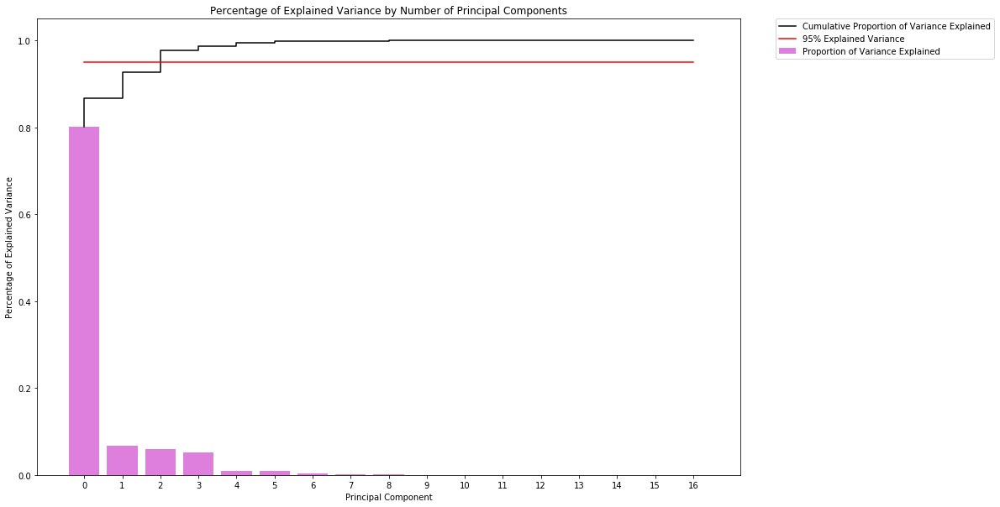

In [282]:
pca = PCA()
pca.fit(scaled_X)

# plot of cumulative and individual explained variance ratio in bar and step graph form. Adds a line at 95%
# cumulative variance
number_of_features = len(scaled_X.columns)
plt.figure(figsize=(15,10))
plt.bar(range(number_of_features), pca.explained_variance_ratio_, color='m', alpha=0.5, label='Proportion of Variance Explained')
plt.step(range(number_of_features), np.cumsum(pca.explained_variance_ratio_), label='Cumulative Proportion of Variance Explained', c='k')
plt.plot(range(number_of_features), [0.95] * number_of_features, color='r', label='95% Explained Variance')
plt.xticks(list(range(number_of_features)))
plt.xlabel('Principal Component')
plt.ylabel('Percentage of Explained Variance')
plt.title('Percentage of Explained Variance by Number of Principal Components')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

In [283]:
EVR_df = pd.DataFrame(np.cumsum(pca.explained_variance_ratio_)).T
EVR_df.columns = ['PCA ' + str(i) for i in list(EVR_df.columns)]
EVR_df.index = ['Cumulative explained variance ratio']
EVR_df.head()

,PCA 0,PCA 1,PCA 2,PCA 3,PCA 4,PCA 5,PCA 6,PCA 7,PCA 8,PCA 9,PCA 10,PCA 11,PCA 12,PCA 13,PCA 14,PCA 15,PCA 16
Cumulative explained variance ratio,0.800681,0.867135,0.9263,0.977411,0.986296,0.9949,0.997581,0.998394,0.998982,0.99931,0.999574,0.999806,0.999897,0.999965,0.999993,0.999997,1.0


In [349]:
def optimize_model(X_train, y_train, X_test, y_test, data_dict, model, pca):
    '''
    Runs all the linear or nonlinear models, with PCA preprocessing on or off, and writes them to the
    best classification model dictionary
    @param X_train: training X values, pandas DataFrame
    @param y_train: training y values, pandas DataFrame
    @param X_test: testing X values, pandas DataFrame
    @param y_test: testing X values, pandas DataFrame
    @param data_dict: instance of a classification model dictionary, OrderedDict
    @param model: classification model to use as sklearn method, string
    @param pca: whether to use pca or not, boolean
    @return data_dict.view: best classification model dictionary, OrderedDict
    '''
    feature_count = len(X_test.columns)
    models = dict(LogisticRegression={
        'name': 'Logistic Regression',
        'model': LogisticRegression(),
        'params': {
            'model__solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],
            'model__warm_start': True,
            'model__C': [0.1, 1, 10]
        }
    }, LDA={
        'name': 'LDA',
        'model': LDA(),
        'params': {
            'model__solver': ['svd', 'lsqr', 'eigen']
        }
    }, GaussianNB={
        'name': 'Gaussian Naive Bayes',
        'model': GaussianNB(),
        'params': {}
    }, MultinomialNB={
        'name': 'Multinomial Naive Bayes',
        'model': MultinomialNB(),
        'params': {}
    }, QDA={
        'name': 'QDA',
        'model': QDA(),
        'params': {}
    }, DecisionTreeClassifier={
        'name': 'Decision Tree',
        'model': DecisionTreeClassifier(),
        'params': {
            'model__min_samples_split': [2, 5, 10],
            'model__min_samples_leaf': [2, 5, 10]
        }
    }, SVC={
        'name': 'RBF SVC',
        'model': SVC(),
        'params': {
            'model__C': [0.1, 1, 10],
            'model__degree': [2, 3, 4, 5],
            'model__gamma': [0.1, 1, 10],
            'model__kernel': ['rbf']
        }
    }, KNeighborsClassifier={
        'name': 'K Neighbors Classifier',
        'model': KNeighborsClassifier(),
        'params': {
            'model__n_neighbors': list(range(1, feature_count + 1))
        }
    }, RandomForest={
        'name': 'Random Forest',
        'model': RandomForestClassifier(),
        'params': {
            "model__max_depth": [3, None],
            "model__max_features": list(range(1, 11)),
            "model__min_samples_split": list(range(2, 11)),
            "model__min_samples_leaf": list(range(1, 11)),
            "model__bootstrap": [True, False],
            "model__criterion": ["gini", "entropy"]
        }
    }, GradientBoostingClassifier={
        'name': 'Gradient Boosting Classifier',
        'model': GradientBoostingClassifier(),
        'params': {
            'model__loss': ['deviance', 'exponential'],
            'model__n_estimators': 50,
            'model__min_samples_leaf': [10, 15],
            'model__min_samples_split': [5, 10, 15],
            'model__max_features': [feature_number, feature_number - 1, feature_number - 2],
            'model__subsample': [0.5, 0.6, 0.7]
        }
    }, AdaBoostClassifier={
        'name': 'Ada Boost Classifier',
        'model': AdaBoostClassifier(),
        'params': {
            'model__n_estimators': list(range(100, 300, 50)),
            'model__learning_rate': list(np.arange(0.7, 1.1, 0.1))
        }
    })
        
    pipeline_steps = [('model', 'dummy_str')]
    if pca:
        pca_clf = PCA()
        pipeline_steps[0] = (('pca', pca_clf))
        
    for name, model, param in zip(models[model], models, params):
        if pipeline_steps[-1][0] == 'model': pipeline_steps[-1] = (('model', model))
        else: pipeline_steps.append(('model', model))
        pipe = Pipeline(steps=pipeline_steps)
        if 'pca' in pipe.named_steps:
            param['pca__n_components'] = [3, 4, 5, 6]
            print(pipe, "\n")
#             name = str(pipe.named_steps['pca'].n_components_) + " Component PCA" + name
        grid = GridSearchCV(pipe, param, verbose=1)
        print(param)
        exit()
        grid.fit(X_train, y_train)
        data_dict.import_model(grid, name, X_train, y_train, X_test, y_test)
    return data_dict

In [26]:
pipe = Pipeline(steps=[('pca', PCA()), ('model', LogisticRegression())])
grid = GridSearchCV(pipe, {'model__C': [0.1, 1, 10], 'pca__n_components': [4, 5]}, verbose=1)
grid.fit(X_train, y_train)
grid.best_estimator_.named_steps['model'].get_params()
#clf_df = pd.DataFrame(grid.cv_results_).sort_values('rank_test_score')
#clf_df #['mean_test_score'].values[0]
if 'pca' in grid.best_estimator_.named_steps:
    print(str(grid.best_estimator_.named_steps['pca'].n_components_) + " Component PCA" + "whatev")


Fitting 3 folds for each of 6 candidates, totalling 18 fits
4 Component PCAwhatev


[Parallel(n_jobs=1)]: Done  18 out of  18 | elapsed:    0.2s finished


In [343]:
n_components = [20, 40, 64]
Cs = np.logspace(-4, 4, 3)
dict(pca__n_components=n_components, logistic__C=Cs)

{'logistic__C': array([  1.00000000e-04,   1.00000000e+00,   1.00000000e+04]),
 'pca__n_components': [20, 40, 64]}

In [328]:
data_dict.clear()

Ranking Cleared.


In [329]:
data_dict = optimize_model(X_train, y_train, X_test, y_test, data_dict, model_type='linear', pca=False)

Fitting 3 folds for each of 1 candidates, totalling 3 fits


[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.1s finished


Fitting 3 folds for each of 3 candidates, totalling 9 fits
Fitting 3 folds for each of 1 candidates, totalling 3 fits


[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s finished


In [ ]:
data_dict = optimize_model(X_train, y_train, X_test, y_test, data_dict, model_type='linear', pca=True)

Pipeline(memory=None,
     steps=[('pca', PCA(copy=True, iterated_power='auto', n_components=None, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)), ('model', LogisticRegressionCV(Cs=10, class_weight=None, cv=None, dual=False,
           fit_intercept=True, intercept_scaling=1.0, max_iter=100,
           multi_class='ovr', n_jobs=1, penalty='l2', random_state=None,
           refit=True, scoring=None, solver='lbfgs', tol=0.0001, verbose=0))]) 

{'model__Cs': [1.0, 2.0, 3.0, 4.0], 'pca__n_components': [3, 4, 5, 6]}
Fitting 3 folds for each of 16 candidates, totalling 48 fits


TypeError: object of type 'numpy.float64' has no len()

In [288]:
data_dict = optimize_model(X_train, y_train, X_test, y_test, data_dict, model_type='nonlinear', pca=False)

In [291]:
data_dict = optimize_model(X_train, y_train, X_test, y_test, data_dict, model_type='nonlinear', pca=True)

In [315]:
data_dict = optimize_model(X_train, y_train, X_test, y_test, data_dict, model_type='ensemble', pca=False)

In [326]:
data_dict.view()['Best Model Params'][12].named_steps['pca'].n_components_ 

3

In [316]:
data_dict.view()

,Model,Training Score,Test Score,Fit Time,Best Model Params
18,Gradient Boosting Classifier,0.693622,0.609937,0.095538,"Pipeline(memory=None,\n steps=[('model', G..."
17,Random Forest,0.617689,0.598309,0.040919,"Pipeline(memory=None,\n steps=[('model', R..."
19,Ada Boost Classifier,0.698908,0.595842,0.834108,"Pipeline(memory=None,\n steps=[('model', A..."
0,Logistic Regression CV,0.598485,0.585271,0.267556,"Pipeline(memory=None,\n steps=[('model', L..."
3,Logistic Regression CV,0.598661,0.585271,0.266490,"Pipeline(memory=None,\n steps=[('model', L..."
4,LDA,0.598837,0.583510,0.003421,"Pipeline(memory=None,\n steps=[('model', L..."
1,LDA,0.598837,0.583510,0.003047,"Pipeline(memory=None,\n steps=[('model', L..."
8,RBF SVC,0.615398,0.581748,0.116992,"Pipeline(memory=None,\n steps=[('model', S..."
12,PCA + Naive Bayes,0.581395,0.580338,0.004151,"Pipeline(memory=None,\n steps=[('pca', PCA..."
11,PCA + LDA,0.579105,0.578224,0.004946,"Pipeline(memory=None,\n steps=[('pca', PCA..."


In [ ]:
# from sklearn.gaussian_process import GaussianProcessClassifier
# from sklearn.gaussian_process.kernels import RBF

# clf = GaussianProcessClassifier(1.0 * RBF(1.0), warm_start=True)
# clf.fit(X_train, y_train)
# clf.score(X_test, y_test)
# pd.DataFrame(grid.cv_results_).sort_values('rank_test_score')

Of the linear models, it looks like QDA perfroms the best, but 58% isn't that great. We'll try some ensemble methods and multivariate models, using the same train/test split. First, some Support Vector Machine (SVM) models, who also have a linear version, so we'll test that too.

In [3]:
clf.best_estimator_

NameError: name 'clf' is not defined

In [ ]:
# scoring = {'AUC': 'roc_auc', 'Accuracy': make_scorer(accuracy_score)}

# Setting refit='AUC', refits an estimator on the whole dataset with the
# parameter setting that has the best cross-validated AUC score.
# That estimator is made available at ``gs.best_estimator_`` along with
# parameters like ``gs.best_score_``, ``gs.best_parameters_`` and
# ``gs.best_index_``
param_list = {'C': scipy.stats.expon(scale=100), 'gamma': scipy.stats.expon(scale=.1),
  'kernel': ['rbf'], 'class_weight':['balanced', None]}
n_iter_search = 20
random_search = RandomizedSearchCV(clf, param_distributions=param_dist,
                                   n_iter=n_iter_search)

# gs = GridSearchCV(DecisionTreeClassifier(random_state=42),
#                   param_grid={'min_samples_split': range(2, 403, 10)},
#                   scoring=scoring, cv=5, refit='AUC')
random_search.fit(X, y)
results = gs.cv_results_


One of the important aspects of PCA is the data needs to be normalized, so the variance is comparable across features. Otherwise, variables with larger numbers would appear to have larger variance than they have in reality.

It looks as if only 6 principal components are necessary to explain 95% of the variance when it comes to QB statistics, so we can now re-run PCA to only encompass 6 components, and use that to train the dataset.

In order to apply a PCA-reduced dataset to a training model, the easiest way is to use sklearn's Pipeline object, which chains methods together.

Looks like the best parameters are 13 principal components and a C of 10000. However, it should be noted that C does not have a significant effect on the score of the fit, but does effect the time it takes to fit the model a bit.

TREEEEEEEEs

In [30]:
from sklearn.tree import DecisionTreeClassifier
tree = DecisionTreeClassifier(min_samples_split=10, min_samples_leaf=5)
X = test_df.drop(['win_loss', 'player_name', 'date'], 1)
y = pd.Series(np.where(test_df['win_loss'] == 1, 'Win', 'Lose'))

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0)
tree.fit(X_train, y_train)
print(f"Decision Tree training error rate: {1 - tree.score(X_train, y_train)}")

Decision Tree training error rate: 0.14799154334038056


In [ ]:
importances = tree.feature_importances_
indices = np.argsort(importances)[::-1]
feat_labels = list(X.columns)

for f in range(X_train.shape[1]):
    print("%2d) %-*s %f" % (f +1, 30,
                           feat_labels[indices[f]],
                           importances[indices[f]]))
    
plt.title('Feature Importances')
plt.bar(range(X_train.shape[1]),
       importances[indices],
       color='lightblue',
       align='center')
plt.xticks(range(X_train.shape[1]),
          feat_labels[indices], rotation=90)
plt.xlim([-1, X_train.shape[1]])
plt.tight_layout()
plt.show()

In [31]:
from IPython.display import Image
from IPython.display import display
from sklearn.tree import export_graphviz
from sklearn.metrics import accuracy_score
import pydotplus

dot_data = export_graphviz(
tree,
out_file=None,
feature_names=X.columns,
class_names=y_train.unique(),
filled=True,
rounded=True)

graph = pydotplus.graph_from_dot_data(dot_data)
display(Image(graph.create_png()))

print("Decision Tree accuracy: {}%".format(round(accuracy_score(y_test, tree.predict(X_test))*100, 2)))

Decision Tree accuracy: 53.59%


In [37]:
from sklearn.ensemble import RandomForestClassifier

featureRange = list(range(1, X.shape[0] + 1))
estimatorRange = list(range(1, len(X) + 1, 3))
errDictByFeat = {1:{}, 2:{}, 3:{}, 4:{}, 5:{}, 6:{}, 7:{}, 8:{}, 9:{}, 10:{}, 11:{}, 12:{}, 13:{}}
errDictTotal = {}
best_accuracy = 0
best_estimators = 0

for estimator in estimatorRange:
    forest = RandomForestClassifier(n_estimators=estimator,
                                    min_samples_split=10,
                                    min_samples_leaf=5,
                                    max_features='auto',
                                    random_state=0,
                                    n_jobs=4)
    forest.fit(X_train, y_train)
    if accuracy_score(y_test, forest.predict(X_test)) > best_accuracy:
        best_accuracy = round(accuracy_score(y_test, forest.predict(X_test))*100, 2)
        best_estimators = estimator
    if estimator % 100 == 0:
        print(f"{estimator}/len(X) estimations done.")


100/len(X) estimations done.
400/len(X) estimations done.
700/len(X) estimations done.
1000/len(X) estimations done.
1300/len(X) estimations done.
1600/len(X) estimations done.
1900/len(X) estimations done.
2200/len(X) estimations done.
2500/len(X) estimations done.
2800/len(X) estimations done.
3100/len(X) estimations done.
3400/len(X) estimations done.
3700/len(X) estimations done.


In [105]:
len(X)

3784